J'ai validé il y a peu **une formation d'analyste de données** à la Wild Code School. Ce cursus m'a convaincu de la puissance du langage Python **en infographie statique**, et le récent article d'un confrère de Rue89 Strasbourg [sur le risque accru d'inondation en Alsace](https://www.rue89strasbourg.com/changement-climatique-lalsace-menacee-de-graves-inondations-213486) m'a offert **un bon terrain de jeu pour le vérifier**.

On va d'abord entamer par l'import des modules nécessaires :

In [1]:
import os, requests, rasterio
import geopandas as gpd
import matplotlib.pyplot as plt
from rasterio.plot import show
from rasterio.features import sieve
from PIL import Image, ImageOps
from bs4 import BeautifulSoup

# Préparation des fichiers

Zone de Strasbourg oblige, on va d'abord récupérer les contours des 33 villes composant l'Eurométropole. Pour cela, rien de tel que de récupérer **les codes INSEE des communes** directement sur Wikipedia.

Cette aspiration se fait aussi simplement que ça grâce [à BeautifulSoup](https://www.crummy.com/software/BeautifulSoup/bs4/doc/) :

In [2]:
eurometropole=[]
url = "https://fr.wikipedia.org/wiki/Eurom%C3%A9tropole_de_Strasbourg"
url = requests.get(url)

soupe = BeautifulSoup(url.text, "lxml")
tableau = soupe.find("table", {"class":"wikitable sortable"})
lignes = tableau.findAll("tr")
# à chaque ligne, si les infos d'une ville existe, on sélectionne le deuxième élément pour le glisser dans notre liste
for ligne in lignes:
    info_ville = ligne.findAll("td")
    if info_ville:
        eurometropole.append(info_ville[1].get_text().replace("\n",""))

A présent, on va utiliser les données d'OpenStreet Map pour :
* **récupérer l'ensemble des villes** françaises en tant que GeoDataFrame
* ne retenir que celles **dont les INSEE correspondent à la liste précédente**
* ne garder de ces polygones **que leurs contours**
* **modifier la projection**

In [3]:
villes = gpd.read_file("https://osm13.openstreetmap.fr/~cquest/openfla/export/communes-20210101-shp.zip")
v_eurometropole=villes[villes["insee"].isin(eurometropole)].boundary
v_eurometropole=v_eurometropole.to_crs("EPSG:3857")
len(v_eurometropole)

33

On va ensuite passer aux calques **des différentes zones inondables**. Pour le coup, on ne peut pas faire autrement que de télécharger directement les données [sur le site de Géorisques](https://www.georisques.gouv.fr/donnees/bases-de-donnees/zonages-inondation-rapportage-2020).

On extrait le zip, et on sélectionne avec geopandas les différents fichiers shp intéressants (il y en a quatre dans cet exemple). A chaque nouveau calque, on reprojette en *EPSG:3857* :

In [4]:
z_prob_forte = gpd.read_file("data/inondations/n_tri_agglomeration_strasbourgeoise_inondable_01_01for_s_067.shp")
z_prob_forte=z_prob_forte.to_crs("EPSG:3857")
z_prob_moyenne = gpd.read_file("data/inondations/n_tri_agglomeration_strasbourgeoise_inondable_01_02moy_s_067.shp")
z_prob_moyenne=z_prob_moyenne.to_crs("EPSG:3857")
z_prob_faible = gpd.read_file("data/inondations/n_tri_agglomeration_strasbourgeoise_inondable_01_04fai_s_067.shp")
z_prob_faible=z_prob_faible.to_crs("EPSG:3857")
z_soustraites = gpd.read_file("data/inondations/n_tri_agglomeration_strasbourgeoise_soust_inond_s_067.shp")
z_soustraites=z_soustraites.to_crs("EPSG:3857")

# Version vectorielle

Première carte : du vectoriel. Simple, sans bavure, avec un fond blanc. Seules difficultés, **la personnalisation de la légende** et **les différents zorder** pour afficher les calques dans le bon ordre.

Une douzaine de ligne, et l'affaire est réglée:

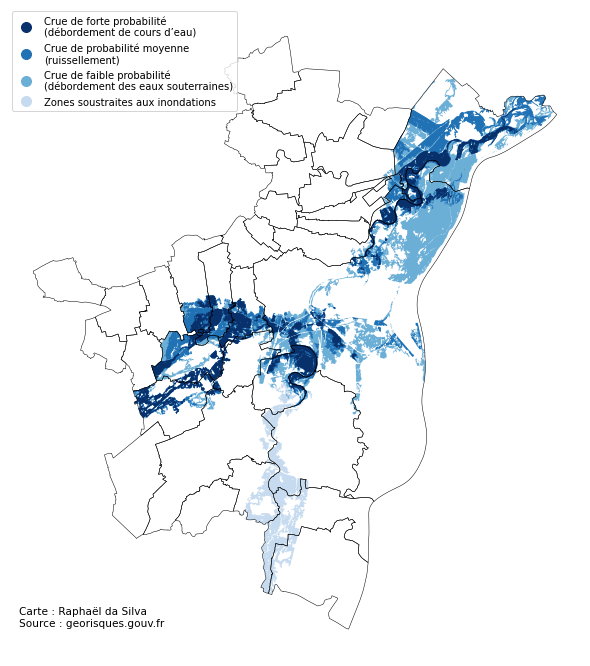

In [5]:
legende={"Crue de forte probabilité\n(débordement de cours d’eau)": "#08306b", "Crue de probabilité moyenne\n(ruissellement)": "#2171b5", "Crue de faible probabilité\n(débordement des eaux souterraines)": "#6baed6", "Zones soustraites aux inondations": "#c6dbef"}

fig, ax = plt.subplots(figsize=(12,12))

v_eurometropole.plot(ax=ax, color = "#000", linewidth=.5,zorder=6)
z_soustraites.plot(ax=ax, color="#c6dbef", zorder=2)
z_prob_faible.plot(ax=ax, color="#6baed6", zorder=3)
z_prob_moyenne.plot(ax=ax, color="#2171b5", zorder=4)
z_prob_forte.plot(ax=ax, color="#08306b", zorder=5)
patches = [ ax.plot([],[], marker="o", ms=10, ls="", mec=None, color=legende[i], 
            label=i)[0]  for i in legende.keys()]
ax.legend(legende.keys(), loc="upper left", facecolor="white").set_zorder(10)
ax.text(0.02, 0.05, "Carte : Raphaël da Silva\nSource : georisques.gouv.fr",  transform=ax.transAxes, color="#000", fontsize=10.5)
ax.axis("off")
plt.savefig("images/livraisons/eurometropole_inondations.jpg", dpi=300, bbox_inches = 'tight');

# Version satellitaire

Cette carte est pas mal, on distingue bien les bords de rivière et **de vastes zones à risque en scénario de probabilité faible**.

Mais les choses seraient peut-être encore plus pertinentes avec **une photo satellite en fond**. Heureux hasard, l'Agence spatiale européenne fournit [avec son EOBrowser](https://apps.sentinel-hub.com/eo-browser) **un réservoir inépuisable de clichés gratuits**.

Une fois inscrit au service, il suffit de rechercher "le" cliché à n'importe quelle date, à choisir le téléchargement sur le menu à droite, et à sélectionner un fichier raster en "couleurs réelles" comme sur la capture :

![EOBrowser](images/illustrations/tuto_sentinelhub.jpg "EOBrowser")

On peut ensuite transformer ce raster au format tiff en variable [grâce au module rasterio](https://rasterio.readthedocs.io/en/latest/), et afficher ses principales infos (*nb : par souci de place, ce raster n'est pas dans ce dossier Github) :

In [6]:
src = rasterio.open("data/raster/2021-06-13-00_00_2021-06-13-23_59_Sentinel-2_L2A_True_color.tiff")

print("Les dimensions du raster sont ",src.width,"x",src.height, " pixels")
print("Sa projection est : ",src.crs)
print("Le centre géographique de l'image se trouve aux coordonnées : ", src.xy(src.height // 2, src.width // 2))

Les dimensions du raster sont  2500 x 1145  pixels
Sa projection est :  EPSG:3857
Le centre géographique de l'image se trouve aux coordonnées :  (820045.7912622326, 6208521.185435157)


Remarquez la projection *EPSG:3857* (magie de l'omniscience). On peut afficher ce fond de carte grâce à matplotlib :

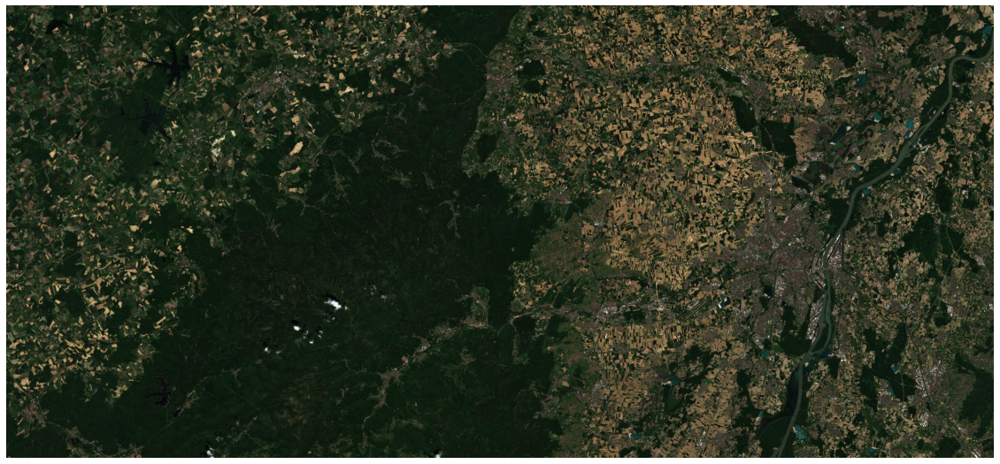

In [7]:
fig, ax = plt.subplots(figsize=(20, 10))
show(src.read(), transform=src.transform, ax=ax)
plt.axis("off");

Les couleurs sont bien, on va donc procéder comme avant avec les calques aux zorders bien placés. On va enregistrer le rendu dans un fichier png :

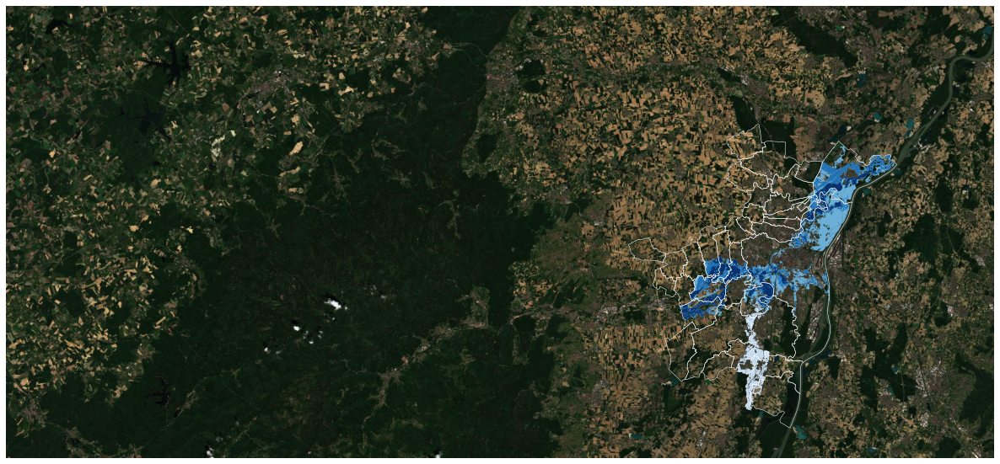

In [9]:
fig, ax = plt.subplots(figsize=(21, 10))
show(src.read(), transform=src.transform, ax=ax)
v_eurometropole.plot(ax=ax, color='#fff', linewidth=.5,zorder=6)
z_soustraites.plot(ax=ax, color="#c6dbef", zorder=2)
z_prob_faible.plot(ax=ax, color="#6baed6", zorder=3)
z_prob_moyenne.plot(ax=ax, color="#2171b5", zorder=4)
z_prob_forte.plot(ax=ax, color="#08306b", zorder=5)
ax.set_axis_off()
fig.savefig("images/terminal/inondation_eurometropole.png", dpi=300, bbox_inches = 'tight')
plt.show()

On va ensuite recycler une fonction décrite [dans un calepin précédent](https://github.com/raphadasilva/blog_rdasilva/blob/master/geographie/GIF%20satellite/Gif%20d'images%20satellites%20avec%20repere%20-%20SentinelHub%20%2B%20PIL%20%2B%20rasterio%20%2B%20geopandas%20(GH).ipynb) qui va appliquer le même rognage à des images présentes dans un dossier.

In [12]:
def taillage_selection(repertoire, bordures):
    # on commence par considérer la dernière image du dossier
    with Image.open(os.path.join(repertoire, os.listdir(repertoire)[-1])) as test:
        im = ImageOps.crop(test, bordures)
        display(im) # à virer pour l'affichage
        reponse = input("OK pour ce retaillage ?\n Marquez 'OK' si c'est le cas")
        if reponse != "OK":
            print("Eh bien retentez autre chose !")
        else:
            print("C'est parti...")
            for photo in os.listdir(repertoire):
                chemin = os.path.join(repertoire, photo)
                with Image.open(chemin) as img:
                    im = ImageOps.crop(img, bordures)
                    im.save(os.path.join(chemin))

Comme il n'y a qu'une image, les choses vont aller très vite :

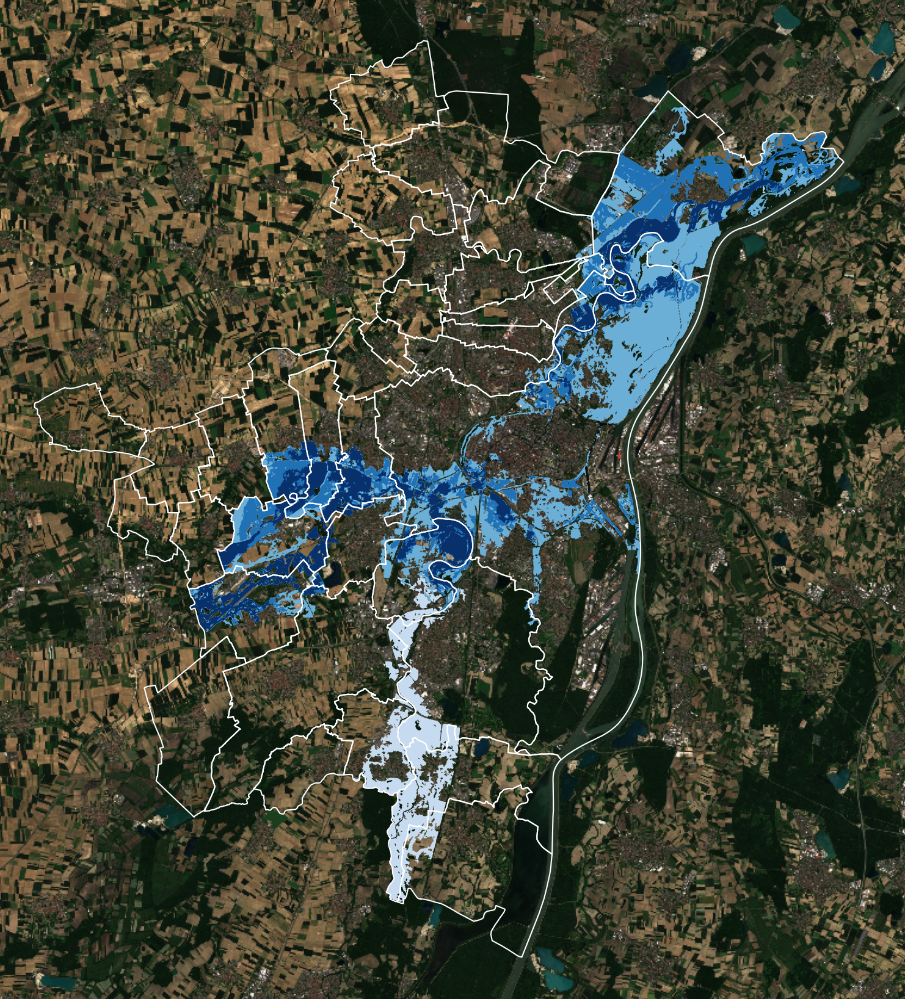

OK pour ce retaillage ?
 Marquez 'OK' si c'est le casOK
C'est parti...


In [13]:
taillage_selection("images/terminal", (3050,550,410,110))

Et maintenant, on peut recycler ce qui a été fait avant **en ajoutant juste la légende et le crédit** :

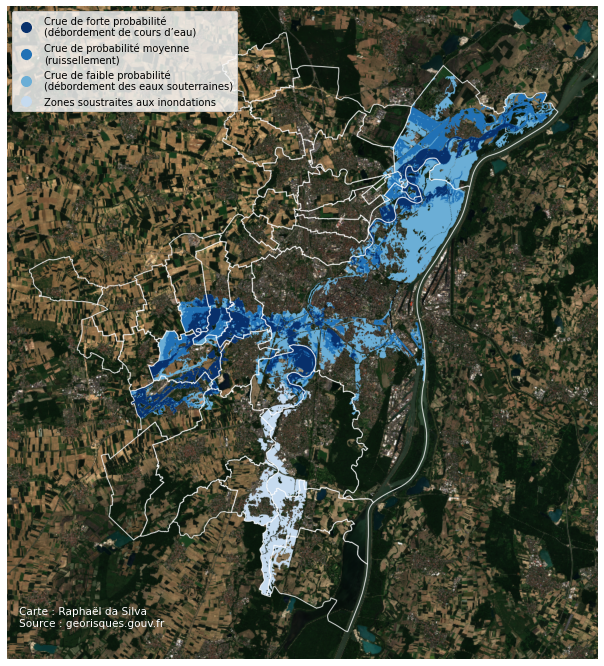

In [14]:
fig, ax = plt.subplots(figsize=(12,12))
img = plt.imread("images/terminal/inondation_eurometropole.png")
plt.imshow(img)
patches = [ ax.plot([],[], marker="o", ms=10, ls="", mec=None, color=legende[i], 
            label=i)[0]  for i in legende.keys()]
ax.legend(legende.keys(), loc="upper left", facecolor="white")
ax.text(0.02, 0.05, "Carte : Raphaël da Silva\nSource : georisques.gouv.fr", transform=ax.transAxes, color="#fff", fontsize=10.5)
plt.axis("off")
plt.savefig("images/livraisons/eurometropole_inondations_sat.jpg", dpi=300, bbox_inches = 'tight');